<a href="https://colab.research.google.com/github/agmCorp/colab/blob/main/AzureFunction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Seleccioná una imagen (JPG/PNG, <=10MB) ...


Saving IMG_8903.jpeg to IMG_8903.jpeg
Texto reconocido (OCR):
--------------------------------------------------
§ 101144
B
0 JUL/2027
È JUL/2025
--------------------------------------------------
Imagen procesada (blanco y negro):


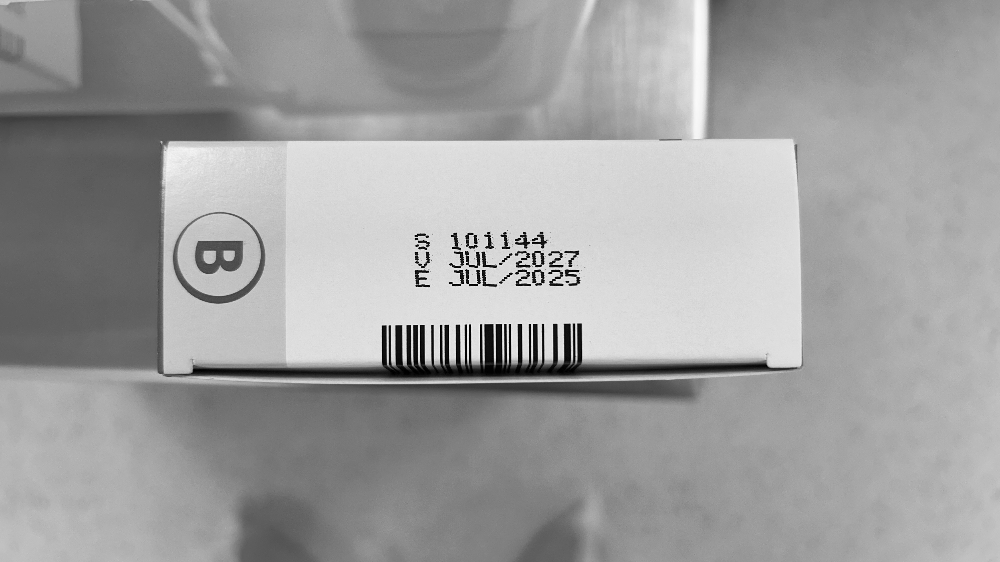

In [ ]:
# -*- coding: utf-8 -*-
# ================================
# Colab: subir imagen -> llamar Azure Function -> mostrar resultado
# Código en inglés; comentarios en español
# ================================

# 1) Configuración (EDITAR: pegá tu URL completa con ?code=...)
FULL_URL = "https://func-serv1-8f7611.azurewebsites.net/api/process-and-ocr?code=<key>"  # <-- REEMPLAZAR

# 2) Imports
import io
import re
import base64
import requests
from PIL import Image
from IPython.display import display
from google.colab import files

# 3) Subir una imagen desde tu PC
#    - Aparecerá un selector de archivos y se guardará el archivo en Colab.
print("Seleccioná una imagen (JPG/PNG, <=10MB) ...")
uploaded = files.upload()
if not uploaded:
    raise SystemExit("No se subió ninguna imagen.")

# Tomar el primer archivo subido
filename, filecontent = next(iter(uploaded.items()))

# 4) Enviar la imagen a la Azure Function como multipart/form-data
#    - El campo se llama 'file' (lo espera así la Function)
files_multipart = {
    "file": (filename, io.BytesIO(filecontent), "application/octet-stream")
}

try:
    resp = requests.post(FULL_URL, files=files_multipart, timeout=60)
except Exception as e:
    raise SystemExit(f"Error de red al invocar la Function: {e}")

# 5) Manejo de respuesta
if resp.status_code != 200:
    # Mostrar error devuelto por la Function
    try:
        print("Respuesta de error:", resp.json())
    except Exception:
        print("Respuesta de error (texto):", resp.text)
    raise SystemExit(f"HTTP {resp.status_code}: fallo al invocar la Function.")

data = resp.json()

# 6) Extraer texto y la imagen B/N en base64 (data URL)
text = data.get("text", "")
bw_data_url = data.get("bw_image_base64", "")

# 7) Decodificar data URL (data:image/png;base64,....) a bytes y mostrarla
if isinstance(bw_data_url, str) and bw_data_url.startswith("data:image"):
    m = re.match(r"^data:image\/[a-zA-Z0-9.+-]+;base64,(.+)$", bw_data_url)
    if not m:
        raise SystemExit("Formato inesperado de data URL en 'bw_image_base64'.")
    img_bytes = base64.b64decode(m.group(1))
    bw_img = Image.open(io.BytesIO(img_bytes))
else:
    # Si viniera crudo el base64 (sin data URL), intentar decodificar directo
    try:
        img_bytes = base64.b64decode(bw_data_url)
        bw_img = Image.open(io.BytesIO(img_bytes))
    except Exception:
        raise SystemExit("No se pudo decodificar 'bw_image_base64'.")

# 8) Mostrar resultados
print("Texto reconocido (OCR):")
print("--------------------------------------------------")
print(text if text else "(vacío)")
print("--------------------------------------------------")

print("Imagen procesada (blanco y negro):")
display(bw_img)


Imagen original:


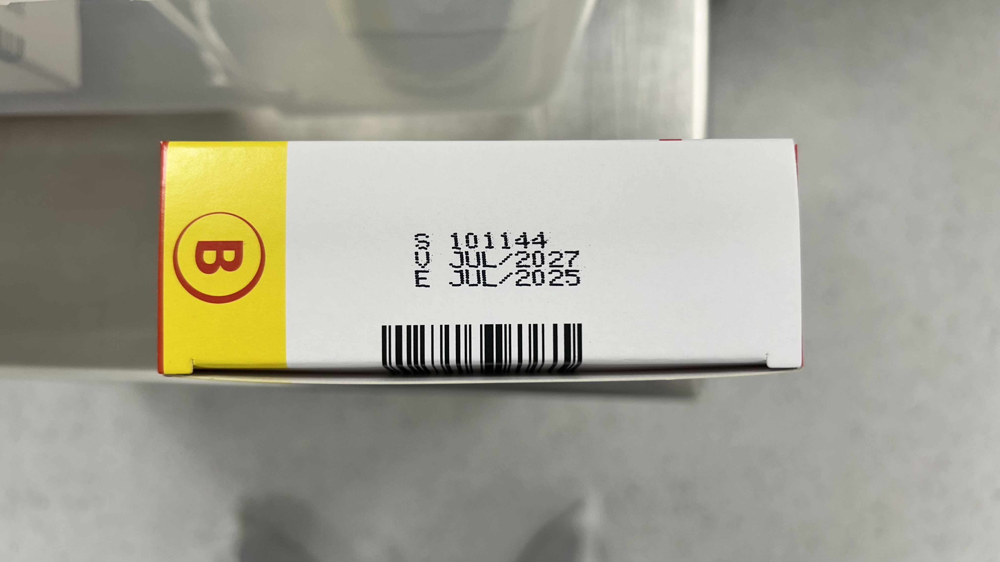

Archivos guardados: ocr_texto.txt  y  resultado_bn.png


In [ ]:
from IPython.display import display
from PIL import Image
import io, re, base64

# Mostrar la imagen original
orig = Image.open(filename)
print("Imagen original:")
display(orig)

# Guardar resultados a archivos
with open("ocr_texto.txt", "w", encoding="utf-8") as f:
    f.write(text or "")

# Guardar la imagen B/N
m = re.match(r"^data:image\/[a-zA-Z0-9.+-]+;base64,(.+)$", bw_data_url)
img_bytes = base64.b64decode(m.group(1)) if m else base64.b64decode(bw_data_url)
with open("resultado_bn.png", "wb") as f:
    f.write(img_bytes)

print("Archivos guardados: ocr_texto.txt  y  resultado_bn.png")